In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import os
import random
from tqdm import tqdm
# import cv2 as cv
import PIL
from PIL import Image
import plotly.express as px
from IPython import display

import torch
from torchvision import datasets
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [ ]:
import torch
from torch import nn, optim, autograd
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.utils as vutils
from dataclasses import dataclass
import time
import sys

In [ ]:
data_dir = 'data/txn_history-2021-10-07.jsonl'
image_dir = "data/cryptopunks/"
image_root = "data/"

In [ ]:

%matplotlib notebook

In [ ]:
# #look at 100 samples
# #define number of rows and cols
# no_plots = 10*10

# #define path
# images = glob.glob("data/cryptopunks/*.png")

# plt.rcParams['figure.figsize'] = (30, 30)
# plt.subplots_adjust(wspace=0, hspace=0)

# print("Sample 100 CryptoPunks")
# for idx,image in enumerate(images[:no_plots]):
#     sample_img = cv.imread(image)
#     plt.subplot(10, 10, idx+1)
#     plt.axis('off')
#     plt.imshow(cv.cvtColor(sample_img,cv.COLOR_BGR2RGB)) #covert color space
# plt.show()

In [ ]:
import pandas as pd
df = pd.read_json('data/txn_history-2021-10-07.jsonl', lines=True)
df.head()

,txn_type,from,to,date,timestamp,source,eth,punk_id,from_wallet_address,to_wallet_address,type,accessories
0,Bid Withdrawn,0xe73a1d,,2021-09-04,2021-09-04,larvalabs,321.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
1,Bid,0xe73a1d,,2021-09-01,2021-09-01,larvalabs,321.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
2,Bid Withdrawn,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,320.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
3,Bid,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,320.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
4,Bid Withdrawn,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,263.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"


In [ ]:
df['txn_type'].unique()

array(['Bid Withdrawn', 'Bid', 'Sold', 'Offered', 'Transfer', 'Claimed',
       'Offer Withdrawn', '(Wrap)', '(Unwrap)'], dtype=object)

In [ ]:
df.size

2009904

In [ ]:
df_test = df.drop_duplicates(subset='punk_id')
df_test[df_test.punk_id == 0]

,txn_type,from,to,date,timestamp,source,eth,punk_id,from_wallet_address,to_wallet_address,type,accessories
0,Bid Withdrawn,0xe73a1d,,2021-09-04,2021-09-04,larvalabs,321.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167492 entries, 0 to 167491
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   txn_type             167492 non-null  object        
 1   from                 167492 non-null  object        
 2   to                   167492 non-null  object        
 3   date                 167492 non-null  datetime64[ns]
 4   timestamp            167492 non-null  datetime64[ns]
 5   source               167492 non-null  object        
 6   eth                  127542 non-null  float64       
 7   punk_id              167492 non-null  int64         
 8   from_wallet_address  419 non-null     object        
 9   to_wallet_address    419 non-null     object        
 10  type                 167492 non-null  object        
 11  accessories          167492 non-null  object        
dtypes: datetime64[ns](2), float64(1), int64(1), object(8)
memory usage: 15.3

In [ ]:
df.columns

Index(['txn_type', 'from', 'to', 'date', 'timestamp', 'source', 'eth',
       'punk_id', 'from_wallet_address', 'to_wallet_address', 'type',
       'accessories'],
      dtype='object')

In [ ]:
df = df[["txn_type", "date", "eth", "punk_id", "type", "accessories"]]
df.head()

,txn_type,date,eth,punk_id,type,accessories
0,Bid Withdrawn,2021-09-04,321.0,0,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
1,Bid,2021-09-01,321.0,0,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
2,Bid Withdrawn,2021-09-01,320.0,0,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
3,Bid,2021-09-01,320.0,0,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
4,Bid Withdrawn,2021-09-01,263.0,0,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"


In [ ]:
df['txn_type'].value_counts()

Offered            65467
Bid                26808
Sold               18979
Bid Withdrawn      16342
Transfer           14225
Offer Withdrawn    10372
Claimed            10000
(Wrap)              2773
(Unwrap)            2526
Name: txn_type, dtype: int64

In [ ]:
df['accessories'].explode().unique()

array(['Green Eye Shadow', 'Earring', 'Blonde Bob', 'Smile', 'Mohawk',
       'Wild Hair', 'Nerd Glasses', 'Pipe', 'Big Shades', 'Goat',
       'Purple Eye Shadow', 'Half Shaved', 'Do-rag', 'Wild White Hair',
       'Spots', 'Clown Eyes Blue', 'Messy Hair', 'Luxurious Beard',
       'Clown Nose', 'Police Cap', 'Big Beard', 'Blue Eye Shadow',
       'Black Lipstick', 'Clown Eyes Green', 'Straight Hair Dark',
       'Blonde Short', 'Purple Lipstick', 'Straight Hair Blonde',
       'Pilot Helmet', 'Hot Lipstick', 'Regular Shades', 'Stringy Hair',
       'Small Shades', 'Frown', 'Eye Mask', 'Muttonchops', 'Bandana',
       'Horned Rim Glasses', 'Crazy Hair', 'Classic Shades', 'Handlebars',
       'Mohawk Dark', 'Dark Hair', 'Peak Spike', 'Normal Beard Black',
       'Cap', 'VR', 'Frumpy Hair', 'Cigarette', 'Normal Beard',
       'Red Mohawk', 'Shaved Head', 'Chinstrap', 'Mole', 'Knitted Cap',
       'Fedora', 'Shadow Beard', 'Straight Hair', 'Hoodie', 'Eye Patch',
       'Headband', 'Cowbo

In [ ]:
len(df['accessories'].explode().unique())

88

In [ ]:
#exploded 'type' list to rows of the subset columns
df = df.explode("type")
df.head()

,txn_type,date,eth,punk_id,type,accessories
0,Bid Withdrawn,2021-09-04,321.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
1,Bid,2021-09-01,321.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
2,Bid Withdrawn,2021-09-01,320.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
3,Bid,2021-09-01,320.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
4,Bid Withdrawn,2021-09-01,263.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]"


In [ ]:
#visualize
fig = px.bar(df[df.txn_type == 'Sold'].groupby("type").agg({"eth": "median"}).sort_values(by="eth").reset_index('type'),
             x="type", 
             y="eth", 
             color="type", 
             title="CryptoPunk Types vs. Price")
fig.show()

In [ ]:
#get number of attributes
df['num_attributes'] = df.accessories.apply(lambda x: len(x))
df.head()

,txn_type,date,eth,punk_id,type,accessories,num_attributes
0,Bid Withdrawn,2021-09-04,321.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]",3
1,Bid,2021-09-01,321.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]",3
2,Bid Withdrawn,2021-09-01,320.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]",3
3,Bid,2021-09-01,320.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]",3
4,Bid Withdrawn,2021-09-01,263.0,0,Female,"[Green Eye Shadow, Earring, Blonde Bob]",3


In [ ]:
#compare number of attributes vs. price
fig = px.bar(df[(df.txn_type == "Sold") & ((df.type == "Female") | (df.type == "Male"))].groupby("num_attributes").agg({"eth": "mean"}).reset_index("num_attributes"),
             x="num_attributes", 
             y="eth", 
             color="eth", 
             title="CryptoPunk Price per Number of Attributes of Human Punks")
fig.show()

In [ ]:
#visualize number of attributes vs price for alien
fig = px.bar(df[(df.txn_type == "Sold") & ((df.type == "Alien"))].groupby("num_attributes").agg({"eth": "mean"}).reset_index("num_attributes"),
             x="num_attributes", 
             y="eth", 
             color="eth", 
             title="CryptoPunk Price per Number of Attributes of Alien Punks")
fig.show()

In [ ]:
#visualize number of attributes vs price for zombie
fig = px.bar(df[(df.txn_type == "Sold") & ((df.type == "Zombie"))].groupby("num_attributes").agg({"eth": "mean"}).reset_index("num_attributes"),
             x="num_attributes", 
             y="eth", 
             color="eth", 
             title="CryptoPunk Price per Number of Attributes of Zombie Punks")
fig.show()

In [ ]:
#visualize number of attributes vs price for ape
fig = px.bar(df[(df.txn_type == "Sold") & ((df.type == "Ape"))].groupby("num_attributes").agg({"eth": "mean"}).reset_index("num_attributes"),
             x="num_attributes", 
             y="eth", 
             color="eth", 
             title="CryptoPunk Price per Number of Attributes of Ape Punks")
fig.show()

# DCGAN

In [ ]:
#display tensor image
def tensor_imshow(img, dnorm=True):
    img = img.to('cpu')
    npimg = img.detach().numpy()
    if dnorm:
        npimg = npimg*0.5+0.5
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

In [ ]:
def get_dataloader(batch_size,           #batch size during training
                   image_size,           #spatial size of training images
                   data_dir=image_dir,   #root directory for dataset
                   num_workers=3):       #number of sub-processes
    
    stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) 
    
    #create transformer to transform images
    transform = transforms.Compose([transforms.Resize((image_size, image_size)),  #resize
                                    transforms.ToTensor(),                        #convert to tensor
                                    transforms.Normalize(*stats)])                #normalize to be between -1 and 1
    
    #create the dataset
    dataset = datasets.ImageFolder(root=data_dir,
                                   transform=transform)
    
    #create the dataloader
    data_loader = torch.utils.data.DataLoader(dataset,
                                              batch_size=batch_size,
                                              shuffle=True,
                                              num_workers=num_workers,
                                              pin_memory=True)
    
    return data_loader

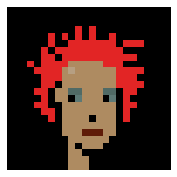

In [ ]:
#test dataloader
batch_size, image_size = 5, 24

train_loader = get_dataloader(batch_size,
                              image_size,
                              image_root)

dataiter = iter(train_loader) #dataloader is an iterator

img,_ = next(dataiter)
sample_img = img[-1]

#display tensor image
tensor_imshow(sample_img)

In [ ]:
class Generator(nn.Module):       #signals neural network
    def __init__(self, 
                 z_dim=100,      #noise vector
                 im_chan=3,      #color chanel, 3 for red green blue
                 hidden_dim=64): #spatial size of feature map (conv)
        
        super(Generator, self).__init__()
        self.z_dim = z_dim
        self.im_chan = im_chan
        self.hidden_dim = hidden_dim
        
        self.generator_cnn = nn.Sequential(self.make_gen_block(z_dim, hidden_dim*8, stride=1, padding=0),   
                                           #(64*8) x 4 x 4
                                           self.make_gen_block(hidden_dim*8, hidden_dim*4),                           
                                           #(64*4) x 8 x 8
                                           self.make_gen_block(hidden_dim*4, hidden_dim*2),                           
                                           #(64*2) x 16 x 16
                                           self.make_gen_block(hidden_dim*2, hidden_dim),                             
                                           #(64) x 32 x 32
                                           self.make_gen_block(hidden_dim, im_chan, final_layer=True))
    
    def make_gen_block(self, 
                       im_chan,     #image dimension
                       op_chan,     #output dimension
                       kernel_size=4, 
                       stride=2, 
                       padding=1, 
                       final_layer=False): 
        
        layers = []
        #de-convolutional layer
        layers.append(nn.ConvTranspose2d(im_chan,     
                                         op_chan, 
                                         kernel_size, 
                                         stride, 
                                         padding, 
                                         bias=False))
        
        if not final_layer:
            layers.append(nn.BatchNorm2d(op_chan))
            layers.append(nn.LeakyReLU(0.2))
        else:
            layers.append(nn.Tanh())
        
        return nn.Sequential(*layers)
    
    def forward(self,noise):
        x = noise.view(-1,self.z_dim,1,1)
        return self.generator_cnn(x)

    def get_noise(n_samples, 
                  z_dim, 
                  device='cpu'):
        return torch.randn(n_samples, 
                           z_dim, 
                           device=device)

In [ ]:
#test Generator
noise = Generator.get_noise(n_samples=5,
                            z_dim=100)

g = Generator(z_dim=100,
              im_chan=3,
              hidden_dim=64)
print(g)

Generator(
  (generator_cnn): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_run

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, 
                 im_chan=3,       #image channels, 3 for red green blue
                 conv_dim=64,     #spatial dimension of feature map
                 image_size=64):  #spatial size of training images
        
        super(Discriminator, self).__init__()
        self.image_size = image_size
        self.conv_dim = conv_dim
        
        self.disc_cnn = nn.Sequential(self.make_disc_block(im_chan, conv_dim),
                                      self.make_disc_block(conv_dim, conv_dim*2),
                                      self.make_disc_block(conv_dim*2, conv_dim*4),
                                      self.make_disc_block(conv_dim*4, conv_dim*8),
                                      #no need a sigmoid here since it is included in the loss function
                                      self.make_disc_block(conv_dim*8, 1, padding=0, final_layer=True)) 
        
        
    def make_disc_block(self,
                        im_chan,
                        op_chan,
                        kernel_size=4,
                        stride=2,
                        padding=1,
                        final_layer=False):
        layers = []
        layers.append(nn.Conv2d(im_chan,
                                op_chan,
                                kernel_size,
                                stride,
                                padding,
                                bias=False))
        
        if not final_layer:
            layers.append(nn.BatchNorm2d(op_chan))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
        
        return nn.Sequential(*layers)
    
    #given an image tensor, returns a 1-dimension tensor representing fake/real
    def forward(self,image):
        pred = self.disc_cnn(image)
        pred = pred.view(image.size(0),-1)
        return pred
    
    def _get_final_feature_dimention(self):
        final_width_height = (self.image_size //  2**len(self.disc_cnn))**2
        final_depth = self.conv_dim * 2**(len(self.disc_cnn)-1)
        return final_depth*final_width_height

In [ ]:
#test Discriminator
d = Discriminator(im_chan=3,
                  conv_dim=64,
                  image_size=64)
print(d)

Discriminator(
  (disc_cnn): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affi

In [ ]:
#custom weights initialization to randomly initialize all weights
#mean=0, stdev=0.2
def weights_init_normal(m):
    
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02) 
        
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

In [ ]:
def real_loss(D_out,device='cpu'):
    
    #initialize BCELoss function
    criterion = nn.BCEWithLogitsLoss()
    
    #batch size
    batch_size = D_out.size(0)
    
    #labels will be used when calculating the losses
    #real labels = 1 and lable smoothing => 0.9
    labels = torch.ones(batch_size, device=device)*0.9 
    
    loss = criterion(D_out.squeeze(), labels)
    return loss

In [ ]:
def fake_loss(D_out, device='cpu'):
    
    #initialize BCELoss function
    criterion = nn.BCEWithLogitsLoss()
    
    #batch size
    batch_size = D_out.size(0)
    
    #labels will be used when calculating the losses
    #fake labels = 0
    labels = torch.zeros(batch_size,
                         device=device) 
    
    loss = criterion(D_out.squeeze(), labels)
    return loss

In [ ]:
def print_tensor_images(images_tensor):
    
    '''
    Function for visualizing images: Given a tensor of images, prints the images.
    '''
        
    plt.rcParams['figure.figsize'] = (15, 15)
    plt.subplots_adjust(wspace=0, hspace=0)
    
    images_tensor = images_tensor.to('cpu')
    npimgs = images_tensor.detach().numpy()
    
    no_plots = len(images_tensor)

    for idx,image in enumerate(npimgs):
        plt.subplot(1, 8, idx+1)
        plt.axis('off')
        #dnorm
        image = image * 0.5 + 0.5
        plt.imshow(np.transpose(image, (1, 2, 0)))
        
    plt.show()

In [ ]:
def train(D, G, 
          n_epochs,
          dataloader,
          d_optimizer,
          g_optimizer,
          z_dim,
          print_every=50,
          device='cpu'):
    
    #to keep track of the generator’s learning progression, 
    #we will generate a fixed batch of latent vectors that are drawn from a Gaussian distribution   
    sample_size=8
    fixed_z = Generator.get_noise(n_samples=sample_size,
                                  z_dim=z_dim,
                                  device=device)
    
    for epoch in range(1,n_epochs+1):
        #use dataloader to fetch batches
        for batch_i,(real_images,_) in enumerate(dataloader):
            batch_size = real_images.size(0)
            real_images = real_images.to(device)
            
            #Part 1: Train the Discriminator ========================================================
            #goal: to maximize the probability of correctly classifying a given input as real or fake
            
            #zero out the gradients before backpropagation
            d_optimizer.zero_grad()
            
            ##classify all-real batch
            d_real_op = D(real_images) #average output (across the batch) of the discriminator
            d_real_loss = real_loss(d_real_op,
                                    device=device)
            
            #train with all-fake batch
            noise = Generator.get_noise(n_samples=batch_size,
                                        z_dim=z_dim,
                                        device=device)
            fake_images = G(noise)
            
            #classify all-fake batch
            d_fake_op = D(fake_images) #average output (across the batch) of the generator
            d_fake_loss = fake_loss(d_fake_op,
                                    device=device)
            
            #total loss
            d_loss = d_real_loss + d_fake_loss
            
            #update gradients
            d_loss.backward()
            #update optimizer
            d_optimizer.step()
            
            #Part 2: Train the Generator ==============================================================
            #zero out the gradients before backpropagation
            g_optimizer.zero_grad()
            noise = Generator.get_noise(n_samples=batch_size,
                                        z_dim=z_dim,
                                        device=device)
            
            #use discriminator to classify generator's output
            g_out = G(noise)
            d_out = D(g_out)
            
            g_loss = real_loss(d_out, 
                               device=device) 
            #update gradients
            g_loss.backward()
            #update optimizer
            g_optimizer.step()
        
        print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(epoch, 
                                                                               n_epochs, 
                                                                               d_loss.item(),  #keep track of loss
                                                                               g_loss.item())) #keep track of loss
        if (epoch % print_every == 0):
            G.eval()
            sample_image = G(fixed_z)
            print_tensor_images(sample_image)
            G.train()

In [ ]:
#hyperparameters
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device is ", device)

#incorrect hyperparameter settings lead to mode collapse
#we will follow Goodfellow’s paper
z_dim = 100       #noise
beta_1 = 0.5      #as specified in the original DCGAN paper
beta_2 = 0.999 
lr = 0.0002       #as specified in the original DCGAN paper
n_epochs = 100
batch_size = 128
image_size = 64

Device is  cuda


In [ ]:
#initialize generator
generator = Generator(z_dim, 
                      im_chan=3, 
                      hidden_dim=64).to(device)

#initialize discriminator
discriminator = Discriminator(im_chan=3, 
                              conv_dim=64, 
                              image_size=image_size).to(device)

#setup Adam optimizers for generator
g_optimizer = optim.Adam(generator.parameters(), 
                         lr=lr, 
                         betas=(beta_1, beta_2))

#setup Adam optimizers for discriminator
d_optimizer = optim.Adam(discriminator.parameters(), 
                         lr=lr, 
                         betas=(beta_1, beta_2))

#setup dataloader
dataloader = get_dataloader(batch_size, 
                            image_size, 
                            image_root)

In [ ]:
#start training
%time
n_epochs = 100
train(discriminator,
      generator,
      n_epochs,
      dataloader,
      d_optimizer,
      g_optimizer,
      z_dim,
      print_every=10,
      device=device)

Wall time: 0 ns
Epoch [    1/  100] | d_loss: 0.5369 | g_loss: 3.5258
Epoch [    2/  100] | d_loss: 0.9968 | g_loss: 1.3159
Epoch [    3/  100] | d_loss: 0.4836 | g_loss: 2.4780
Epoch [    4/  100] | d_loss: 0.4677 | g_loss: 2.0175
Epoch [    5/  100] | d_loss: 0.9337 | g_loss: 7.7986
Epoch [    6/  100] | d_loss: 0.4142 | g_loss: 2.7892
Epoch [    7/  100] | d_loss: 0.4843 | g_loss: 2.5803
Epoch [    8/  100] | d_loss: 0.5207 | g_loss: 1.9960
Epoch [    9/  100] | d_loss: 0.4661 | g_loss: 2.2870
Epoch [   10/  100] | d_loss: 0.3721 | g_loss: 3.7699
Epoch [   11/  100] | d_loss: 0.3976 | g_loss: 2.9472
Epoch [   12/  100] | d_loss: 0.5649 | g_loss: 1.3314
Epoch [   13/  100] | d_loss: 0.3655 | g_loss: 4.1228
Epoch [   14/  100] | d_loss: 0.5244 | g_loss: 5.7371
Epoch [   15/  100] | d_loss: 0.4701 | g_loss: 2.5384
Epoch [   16/  100] | d_loss: 0.7024 | g_loss: 1.2806
Epoch [   17/  100] | d_loss: 0.3501 | g_loss: 5.4022
Epoch [   18/  100] | d_loss: 0.3548 | g_loss: 4.6527
Epoch [   19

In [ ]:
def save_model(generator,file_name):
    generator = generator.to('cuda')
    torch.save(generator.state_dict(),"cryptopunks_generator.pth")

save_model(generator,"kaggle")

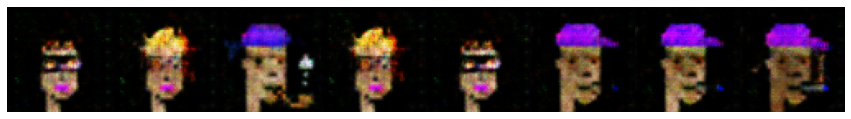

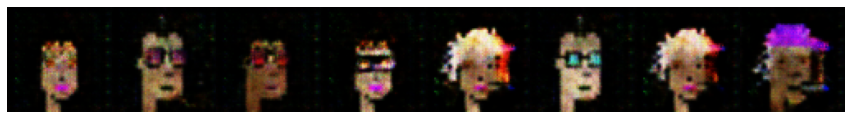

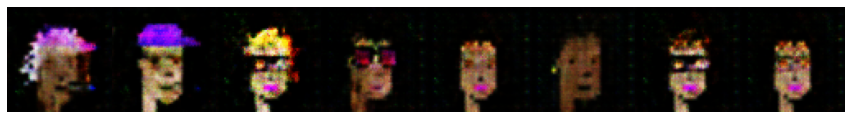

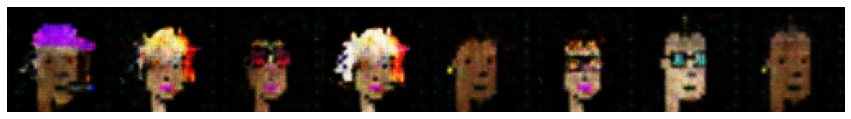

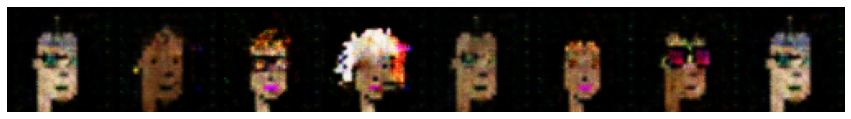

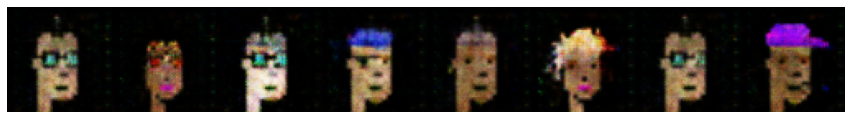

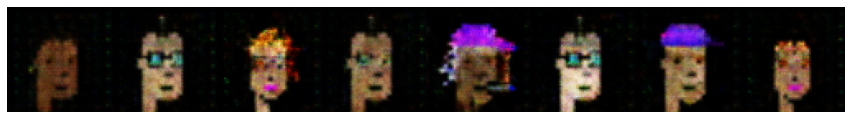

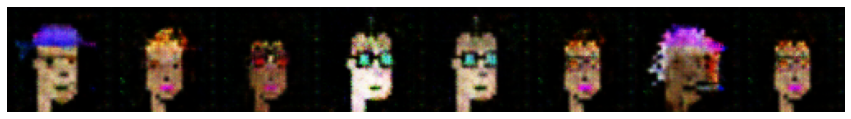

In [ ]:
#sample generation
%matplotlib inline

generator.to(device)
generator.eval()       #eval mode
sample_size=8

for i in range(8):    
    
    #generate latent vectors
    fixed_z = Generator.get_noise(n_samples=sample_size, 
                                  z_dim=z_dim, 
                                  device=device)    
    
    #generate samples
    sample_image = generator(fixed_z)
    
    #display samples
    print_tensor_images(sample_image)

# Conditional DCGAN

In [ ]:
df = pd.read_json('data/txn_history-2021-10-07.jsonl', lines=True)
df.head()

,txn_type,from,to,date,timestamp,source,eth,punk_id,from_wallet_address,to_wallet_address,type,accessories
0,Bid Withdrawn,0xe73a1d,,2021-09-04,2021-09-04,larvalabs,321.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
1,Bid,0xe73a1d,,2021-09-01,2021-09-01,larvalabs,321.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
2,Bid Withdrawn,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,320.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
3,Bid,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,320.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"
4,Bid Withdrawn,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,263.0,0,None,None,[Female],"[Green Eye Shadow, Earring, Blonde Bob]"


In [ ]:
df = df.explode('type')
df.head()

,txn_type,from,to,date,timestamp,source,eth,punk_id,from_wallet_address,to_wallet_address,type,accessories
0,Bid Withdrawn,0xe73a1d,,2021-09-04,2021-09-04,larvalabs,321.0,0,None,None,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
1,Bid,0xe73a1d,,2021-09-01,2021-09-01,larvalabs,321.0,0,None,None,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
2,Bid Withdrawn,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,320.0,0,None,None,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
3,Bid,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,320.0,0,None,None,Female,"[Green Eye Shadow, Earring, Blonde Bob]"
4,Bid Withdrawn,0x2e5e22,,2021-09-01,2021-09-01,larvalabs,263.0,0,None,None,Female,"[Green Eye Shadow, Earring, Blonde Bob]"


In [ ]:
df_label = df[['punk_id', 'type']]
df_label.head()

,punk_id,type
0,0,Female
1,0,Female
2,0,Female
3,0,Female
4,0,Female


In [ ]:
df_label.drop_duplicates(subset=['punk_id'], inplace=True)
df_label.set_index('punk_id', inplace=True)
df_label

C:\Users\ysqj1\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,type
punk_id,
0,Female
1,Male
2,Female
3,Male
4,Male
...,...
9995,Female
9996,Male
9997,Zombie


In [ ]:
df_label.type.unique()

array(['Female', 'Male', 'Zombie', 'Ape', 'Alien'], dtype=object)

In [ ]:
df_label['type'] = df_label['type'].map({'Female': 0, 
                                         'Male': 1, 
                                         'Zombie': 2, 
                                         'Ape': 3, 
                                         'Alien': 4, })
df_label

C:\Users\ysqj1\AppData\Local\Temp/ipykernel_4416/4252603443.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,type
punk_id,
0,0
1,1
2,0
3,1
4,1
...,...
9995,0
9996,1
9997,2


In [ ]:
df_label.type.value_counts()

1    6039
0    3840
2      88
3      24
4       9
Name: type, dtype: int64

In [ ]:
df_label_dict = df_label.type.to_dict()
df_label_dict

{0: 0,
 1: 1,
 2: 0,
 3: 1,
 4: 1,
 5: 0,
 6: 1,
 7: 0,
 8: 1,
 9: 1,
 10: 0,
 11: 0,
 12: 0,
 13: 0,
 14: 0,
 15: 1,
 16: 1,
 17: 1,
 18: 1,
 19: 0,
 20: 1,
 21: 1,
 22: 0,
 23: 1,
 24: 1,
 25: 0,
 26: 0,
 27: 1,
 28: 1,
 29: 0,
 30: 1,
 31: 0,
 32: 1,
 33: 1,
 34: 0,
 35: 1,
 36: 0,
 37: 0,
 38: 0,
 39: 1,
 40: 1,
 41: 1,
 42: 0,
 43: 0,
 44: 1,
 45: 1,
 46: 0,
 47: 1,
 48: 1,
 49: 0,
 50: 1,
 51: 1,
 52: 1,
 53: 0,
 54: 1,
 55: 1,
 56: 1,
 57: 1,
 58: 1,
 59: 1,
 60: 0,
 61: 0,
 62: 0,
 63: 1,
 64: 0,
 65: 0,
 66: 0,
 67: 0,
 68: 1,
 69: 1,
 70: 0,
 71: 0,
 72: 1,
 73: 0,
 74: 1,
 75: 1,
 76: 1,
 77: 1,
 78: 1,
 79: 1,
 80: 1,
 81: 1,
 82: 1,
 83: 1,
 84: 1,
 85: 0,
 86: 0,
 87: 1,
 88: 0,
 89: 0,
 90: 1,
 91: 0,
 92: 0,
 93: 0,
 94: 0,
 95: 1,
 96: 0,
 97: 1,
 98: 0,
 99: 1,
 100: 0,
 101: 1,
 102: 1,
 103: 0,
 104: 1,
 105: 1,
 106: 0,
 107: 1,
 108: 0,
 109: 1,
 110: 0,
 111: 1,
 112: 1,
 113: 1,
 114: 0,
 115: 0,
 116: 0,
 117: 2,
 118: 0,
 119: 1,
 120: 0,
 121: 0,
 122: 1,
 12

In [ ]:
print(f"python Version: {sys.version.split(' ')[0]}")
print(f"torch Version: {torch.__version__}")
print(f"torchvision Version: {torchvision.__version__}")
print(f"GPU: {torch.cuda.get_device_name(0)}")

python Version: 3.9.7
torch Version: 1.11.0
torchvision Version: 0.12.0
GPU: NVIDIA GeForce RTX 2060 SUPER


In [ ]:
#display tensor image
def tensor_imshow(img, dnorm=True):
    img = img.to('cpu')
    npimg = img.detach().numpy()
    if dnorm:
        npimg = npimg*0.5+0.5
    plt.figure(figsize=(3, 3))
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

In [ ]:
images = glob.glob("data/cryptopunks/*.png")
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) 
batch_size, image_size = 5, 24
transform = transforms.Compose([transforms.Resize((image_size, image_size)),  #resize
                                    transforms.ToTensor(),                        #convert to tensor
                                    transforms.Normalize(*stats)])   
train_data = []
for i in range(len(images)):
    img_transform = transform(Image.open(images[i]).convert('RGB'))
    img_name = os.path.basename(images[i])
    img_id = int(os.path.splitext(img_name)[0])
    img_label = df_label_dict[img_id]
    train_data.append([img_transform, img_label])

In [ ]:
batch_size, image_size = 5, 24
train_loader = torch.utils.data.DataLoader(train_data, 
                                          batch_size=batch_size, 
                                          shuffle=True, 
                                          num_workers=3,
                                          pin_memory=True)

<IPython.core.display.Javascript object>


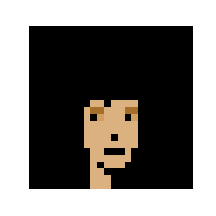

tensor(0)


In [ ]:
#test dataloader
dataiter = iter(train_loader) #dataloader is an iterator

img, label = next(dataiter)
sample_img = img[-1]

#display tensor image
tensor_imshow(sample_img)
print(label[-1])

In [ ]:
class Generator(nn.Module):       #signals neural network
    def __init__(self, 
                 num_classes, 
                 img_size, 
                 embed_size,
                 z_dim=100,      #noise vector
                 im_chan=3,      #color chanel, 3 for red green blue
                 hidden_dim=64, 
                 ): #spatial size of feature map (conv)
        
        super(Generator, self).__init__()
        self.img_size = img_size
        self.z_dim = z_dim
        self.im_chan = im_chan
        self.hidden_dim = hidden_dim
        
        self.generator_cnn = nn.Sequential(self.make_gen_block(z_dim + embed_size, hidden_dim*8, stride=1, padding=0),   
                                           #(64*8) x 4 x 4
                                           self.make_gen_block(hidden_dim*8, hidden_dim*4),                           
                                           #(64*4) x 8 x 8
                                           self.make_gen_block(hidden_dim*4, hidden_dim*2),                           
                                           #(64*2) x 16 x 16
                                           self.make_gen_block(hidden_dim*2, hidden_dim),                             
                                           #(64) x 32 x 32
                                           self.make_gen_block(hidden_dim, im_chan, final_layer=True))
        self.embed = nn.Embedding(num_classes, embed_size)
    
    def make_gen_block(self, 
                       im_chan,     #image dimension
                       op_chan,     #output dimension
                       kernel_size=4, 
                       stride=2, 
                       padding=1, 
                       final_layer=False): 
        
        layers = []
        #de-convolutional layer
        layers.append(nn.ConvTranspose2d(im_chan,     
                                         op_chan, 
                                         kernel_size, 
                                         stride, 
                                         padding, 
                                         bias=False))
        
        if not final_layer:
            layers.append(nn.BatchNorm2d(op_chan))
            layers.append(nn.LeakyReLU(0.2))
        else:
            layers.append(nn.Tanh())
        
        return nn.Sequential(*layers)
    
    def forward(self, noise, labels):
        # latent vector z: N x noise_dim x 1 x 1
        embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
        x = noise.view(-1,self.z_dim,1,1)
        x = torch.cat([x, embedding], dim=1)
        return self.generator_cnn(x)

    def get_noise(n_samples, 
                  z_dim, 
                  device='cpu'):
        return torch.randn(n_samples, 
                           z_dim, 
                           device=device)

In [ ]:
#test Generator
noise = Generator.get_noise(n_samples=5,
                            z_dim=100)

g = Generator(num_classes=5,
              img_size=image_size,
              embed_size=100,
              z_dim=100,
              im_chan=3,
              hidden_dim=64)
print(g)

Generator(
  (generator_cnn): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(200, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_run

torch.Size([8, 3, 64, 64])


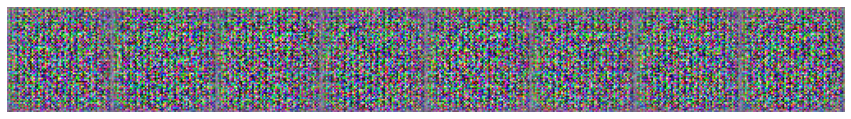

torch.Size([8, 3, 64, 64])


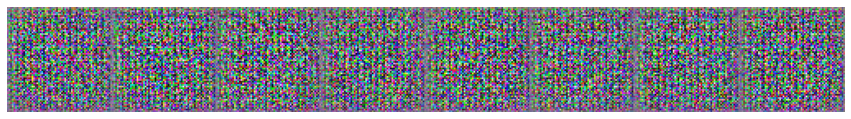

torch.Size([8, 3, 64, 64])


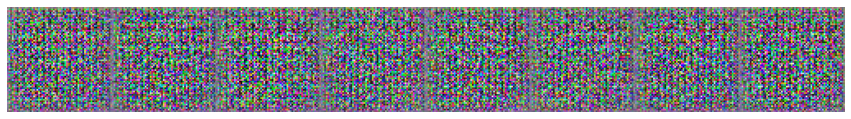

torch.Size([8, 3, 64, 64])


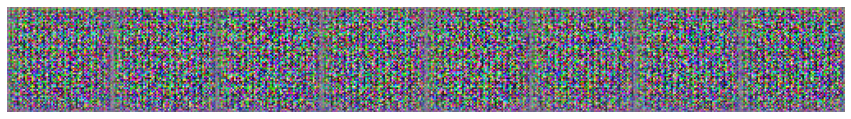

torch.Size([8, 3, 64, 64])


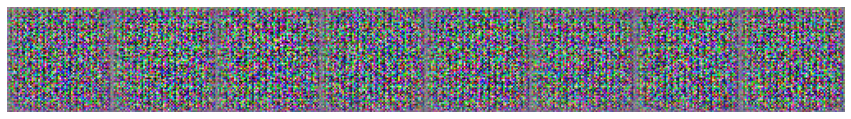

In [ ]:
%matplotlib inline
g = g.to(device)
sample_size=8
fixed_z = Generator.get_noise(n_samples=sample_size,
                              z_dim=z_dim,
                              device=device)
labels = [0,1,2,3,4]
for label in labels:
    label_tensor = torch.tensor(np.ones(sample_size) * label).to(device).long()
    sample_image = g(fixed_z, label_tensor)
    print(sample_image.shape)
    print_tensor_images(sample_image)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, 
                 num_classes, 
                 im_chan=3,       #image channels, 3 for red green blue
                 conv_dim=64,     #spatial dimension of feature map
                 image_size=64):  #spatial size of training images
        
        super(Discriminator, self).__init__()
        self.image_size = image_size
        self.conv_dim = conv_dim
        
        self.disc_cnn = nn.Sequential(self.make_disc_block(im_chan + 1, conv_dim),
                                      self.make_disc_block(conv_dim, conv_dim*2),
                                      self.make_disc_block(conv_dim*2, conv_dim*4),
                                      self.make_disc_block(conv_dim*4, conv_dim*8),
                                      #no need a sigmoid here since it is included in the loss function
                                      self.make_disc_block(conv_dim*8, 1, padding=0, final_layer=True)) 
        self.embed = nn.Embedding(num_classes, self.image_size*self.image_size)
        
        
    def make_disc_block(self,
                        im_chan,
                        op_chan,
                        kernel_size=4,
                        stride=2,
                        padding=1,
                        final_layer=False):
        layers = []
        layers.append(nn.Conv2d(im_chan,
                                op_chan,
                                kernel_size,
                                stride,
                                padding,
                                bias=False))
        
        if not final_layer:
            layers.append(nn.BatchNorm2d(op_chan))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
        
        return nn.Sequential(*layers)
    
    #given an image tensor, returns a 1-dimension tensor representing fake/real
    def forward(self,image, labels):
        embedding = self.embed(labels).view(labels.shape[0], 1, self.image_size, self.image_size)
        x = torch.cat([image, embedding], dim=1) # N x C x img_size (H) x img_size (W)
        pred = self.disc_cnn(x)
        pred = pred.view(x.size(0),-1)
        return pred
    
    def _get_final_feature_dimention(self):
        final_width_height = (self.image_size //  2**len(self.disc_cnn))**2
        final_depth = self.conv_dim * 2**(len(self.disc_cnn)-1)
        return final_depth*final_width_height

In [ ]:
#test Discriminator
d = Discriminator(num_classes=5,
                  im_chan=3,
                  conv_dim=64,
                  image_size=64)
print(d)

Discriminator(
  (disc_cnn): Sequential(
    (0): Sequential(
      (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affi

In [ ]:
#custom weights initialization to randomly initialize all weights
#mean=0, stdev=0.2
def weights_init_normal(m):
    
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02) 
        
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

In [ ]:
def real_loss(D_out,device='cpu'):
    
    #initialize BCELoss function
    criterion = nn.BCEWithLogitsLoss()
    
    #batch size
    batch_size = D_out.size(0)
    
    #labels will be used when calculating the losses
    #real labels = 1 and lable smoothing => 0.9
    loss_labels = torch.ones(batch_size, device=device)*0.9 
    
    loss = criterion(D_out.squeeze(), loss_labels)
    return loss

In [ ]:
def fake_loss(D_out, device='cpu'):
    
    #initialize BCELoss function
    criterion = nn.BCEWithLogitsLoss()
    
    #batch size
    batch_size = D_out.size(0)
    
    #labels will be used when calculating the losses
    #fake labels = 0
    loss_labels = torch.zeros(batch_size,
                         device=device) 
    
    loss = criterion(D_out.squeeze(), loss_labels)
    return loss

In [ ]:
def print_tensor_images(images_tensor):
    
    '''
    Function for visualizing images: Given a tensor of images, prints the images.
    '''
        
    plt.rcParams['figure.figsize'] = (15, 15)
    plt.subplots_adjust(wspace=0, hspace=0)
    
    images_tensor = images_tensor.to('cpu')
    npimgs = images_tensor.detach().numpy()
    
    no_plots = len(images_tensor)

    for idx,image in enumerate(npimgs):
        plt.subplot(1, 8, idx+1)
        plt.axis('off')
        #dnorm
        image = image * 0.5 + 0.5
        plt.imshow(np.transpose(image, (1, 2, 0)))
        
    plt.show()

In [ ]:
%matplotlib inline
def train(D, G, 
          n_epochs,
          dataloader,
          d_optimizer,
          g_optimizer,
          z_dim,
          print_every=50,
          device='cpu'):
    
    #to keep track of the generator’s learning progression, 
    #we will generate a fixed batch of latent vectors that are drawn from a Gaussian distribution   
    sample_size=8
    fixed_z = Generator.get_noise(n_samples=sample_size,
                                  z_dim=z_dim,
                                  device=device)
    
    for epoch in range(1,n_epochs+1):
        #use dataloader to fetch batches
        for batch_i,(real_images, labels) in enumerate(dataloader):
            batch_size = real_images.size(0)
            real_images = real_images.to(device)
            labels = labels.to(device)
            
            #Part 1: Train the Discriminator ========================================================
            #goal: to maximize the probability of correctly classifying a given input as real or fake
            
            #zero out the gradients before backpropagation
            d_optimizer.zero_grad()
            
            ##classify all-real batch
            d_real_op = D(real_images, labels) #average output (across the batch) of the discriminator
            d_real_loss = real_loss(d_real_op,
                                    device=device)
            
            #train with all-fake batch
            noise = Generator.get_noise(n_samples=batch_size,
                                        z_dim=z_dim,
                                        device=device)
            fake_images = G(noise, labels)
            
            #classify all-fake batch
            d_fake_op = D(fake_images, labels) #average output (across the batch) of the generator
            d_fake_loss = fake_loss(d_fake_op,
                                    device=device)
            
            #total loss
            d_loss = d_real_loss + d_fake_loss
            
            #update gradients
            d_loss.backward()
            #update optimizer
            d_optimizer.step()
            
            #Part 2: Train the Generator ==============================================================
            #zero out the gradients before backpropagation
            g_optimizer.zero_grad()
            noise = Generator.get_noise(n_samples=batch_size,
                                        z_dim=z_dim,
                                        device=device)
            
            #use discriminator to classify generator's output
            g_out = G(noise, labels)
            d_out = D(g_out, labels)
            
            g_loss = real_loss(d_out, 
                               device=device) 
            #update gradients
            g_loss.backward()
            #update optimizer
            g_optimizer.step()
        
        print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(epoch, 
                                                                               n_epochs, 
                                                                               d_loss.item(),  #keep track of loss
                                                                               g_loss.item())) #keep track of loss
        if (epoch % print_every == 0):
            G.eval()
            test_labels = [0,1,2,3,4]
            for test_label in test_labels:
                test_label_tensor = torch.tensor(np.ones(sample_size) * test_label).to(device).long()
                sample_image = G(fixed_z, test_label_tensor)
                print_tensor_images(sample_image)
            G.train()

In [ ]:
#hyperparameters
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device is ", device)

#incorrect hyperparameter settings lead to mode collapse
#we will follow Goodfellow’s paper
z_dim = 100       #noise
beta_1 = 0.5      #as specified in the original DCGAN paper
beta_2 = 0.999 
lr = 0.0002       #as specified in the original DCGAN paper
n_epochs = 100
batch_size = 128
image_size = 64

Device is  cuda


In [ ]:
images = glob.glob("data/cryptopunks/*.png")
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) 
transform = transforms.Compose([transforms.Resize((image_size, image_size)),  #resize
                                    transforms.ToTensor(),                        #convert to tensor
                                    transforms.Normalize(*stats)])   
train_data = []
for i in range(len(images)):
    img_transform = transform(Image.open(images[i]).convert('RGB'))
    img_name = os.path.basename(images[i])
    img_id = int(os.path.splitext(img_name)[0])
    img_label = df_label_dict[img_id]
    train_data.append([img_transform, img_label])

In [ ]:
#initialize generator
generator = Generator(num_classes=5, 
                      img_size=image_size,
                      embed_size=100,
                      z_dim=100, 
                      im_chan=3, 
                      hidden_dim=64,).to(device)

#initialize discriminator
discriminator = Discriminator(num_classes=5, 
                              im_chan=3, 
                              conv_dim=64, 
                              image_size=image_size).to(device)

#setup Adam optimizers for generator
g_optimizer = optim.Adam(generator.parameters(), 
                         lr=lr, 
                         betas=(beta_1, beta_2))

#setup Adam optimizers for discriminator
d_optimizer = optim.Adam(discriminator.parameters(), 
                         lr=lr, 
                         betas=(beta_1, beta_2))

#setup dataloader
data_loader = torch.utils.data.DataLoader(train_data, 
                                          batch_size=batch_size, 
                                          shuffle=True, 
                                          num_workers=3,
                                          pin_memory=True)

Wall time: 0 ns
Epoch [    1/  100] | d_loss: 0.7234 | g_loss: 4.1170
Epoch [    2/  100] | d_loss: 0.8101 | g_loss: 2.0653
Epoch [    3/  100] | d_loss: 0.7761 | g_loss: 2.6472
Epoch [    4/  100] | d_loss: 0.8049 | g_loss: 2.8416
Epoch [    5/  100] | d_loss: 0.6741 | g_loss: 3.5327
Epoch [    6/  100] | d_loss: 0.8543 | g_loss: 2.0415
Epoch [    7/  100] | d_loss: 0.6178 | g_loss: 1.9341
Epoch [    8/  100] | d_loss: 1.0706 | g_loss: 1.2708
Epoch [    9/  100] | d_loss: 0.6840 | g_loss: 2.5800
Epoch [   10/  100] | d_loss: 1.2400 | g_loss: 2.3671


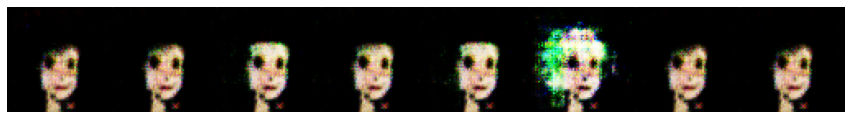

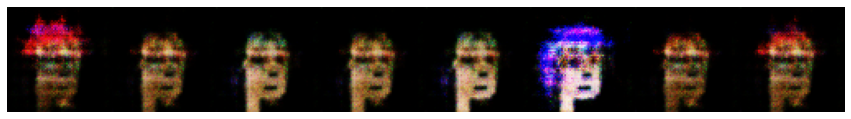

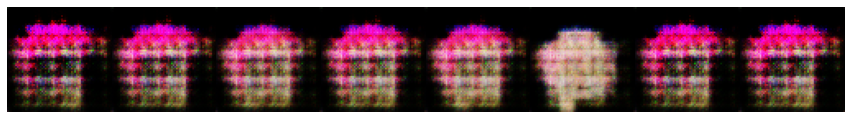

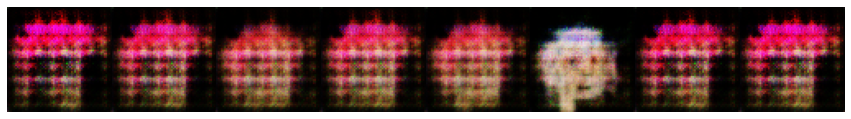

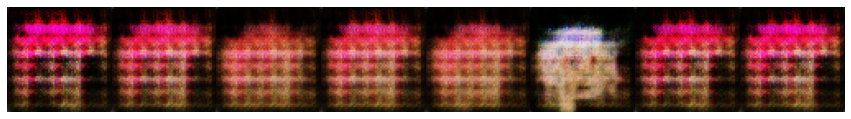

Epoch [   11/  100] | d_loss: 0.5648 | g_loss: 3.0245
Epoch [   12/  100] | d_loss: 0.6175 | g_loss: 3.1085
Epoch [   13/  100] | d_loss: 0.6237 | g_loss: 2.8791
Epoch [   14/  100] | d_loss: 0.7767 | g_loss: 0.9201
Epoch [   15/  100] | d_loss: 1.9797 | g_loss: 0.3691
Epoch [   16/  100] | d_loss: 0.5275 | g_loss: 3.5741
Epoch [   17/  100] | d_loss: 0.4633 | g_loss: 2.2231
Epoch [   18/  100] | d_loss: 0.3902 | g_loss: 3.2085
Epoch [   19/  100] | d_loss: 1.7645 | g_loss: 1.1773
Epoch [   20/  100] | d_loss: 0.5169 | g_loss: 3.1435


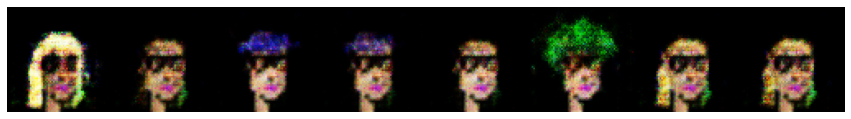

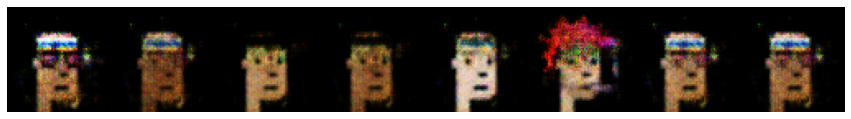

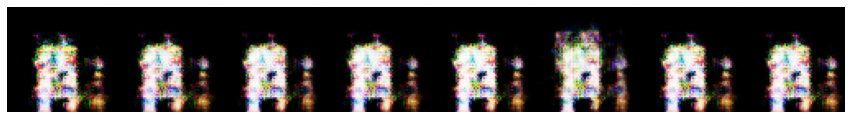

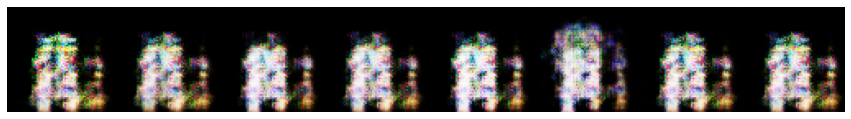

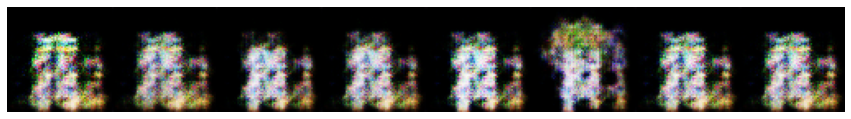

Epoch [   21/  100] | d_loss: 1.5202 | g_loss: 0.5124
Epoch [   22/  100] | d_loss: 0.3736 | g_loss: 6.3206
Epoch [   23/  100] | d_loss: 0.9960 | g_loss: 1.9234
Epoch [   24/  100] | d_loss: 0.5568 | g_loss: 2.0839
Epoch [   25/  100] | d_loss: 0.4048 | g_loss: 5.2937
Epoch [   26/  100] | d_loss: 0.8201 | g_loss: 6.5441
Epoch [   27/  100] | d_loss: 0.6712 | g_loss: 0.7636
Epoch [   28/  100] | d_loss: 0.4156 | g_loss: 3.7922
Epoch [   29/  100] | d_loss: 0.4582 | g_loss: 3.0423
Epoch [   30/  100] | d_loss: 0.3398 | g_loss: 4.5471


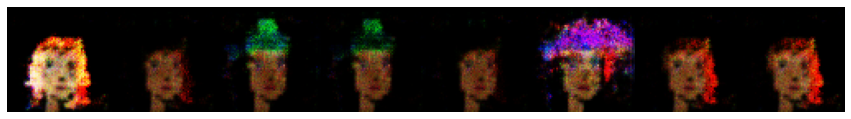

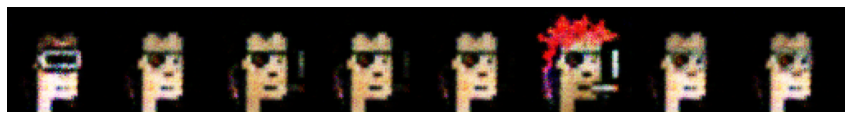

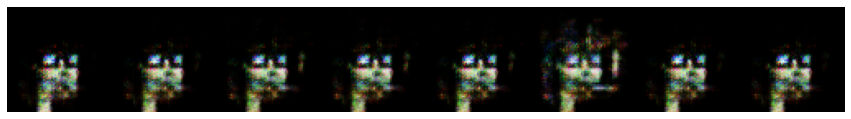

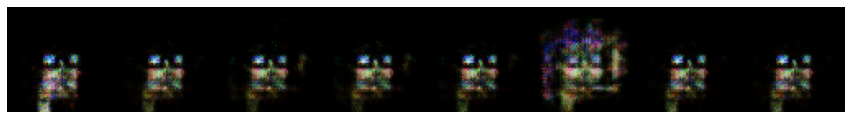

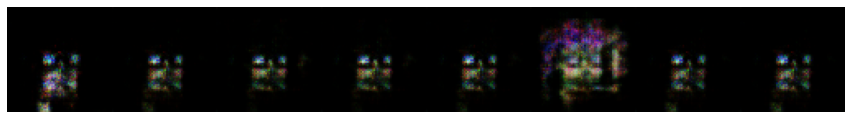

Epoch [   31/  100] | d_loss: 0.4751 | g_loss: 4.6902
Epoch [   32/  100] | d_loss: 1.8165 | g_loss: 0.5573
Epoch [   33/  100] | d_loss: 0.3726 | g_loss: 4.9409
Epoch [   34/  100] | d_loss: 0.3658 | g_loss: 7.9776
Epoch [   35/  100] | d_loss: 0.3597 | g_loss: 4.1840
Epoch [   36/  100] | d_loss: 0.3797 | g_loss: 4.6678
Epoch [   37/  100] | d_loss: 1.0235 | g_loss: 0.5358
Epoch [   38/  100] | d_loss: 0.4113 | g_loss: 3.1662
Epoch [   39/  100] | d_loss: 0.4749 | g_loss: 2.8720
Epoch [   40/  100] | d_loss: 2.4383 | g_loss: 0.5807


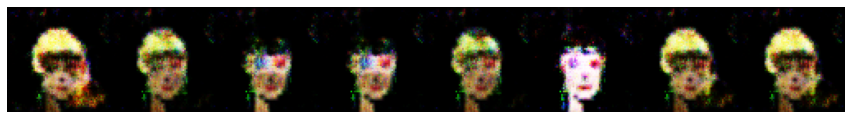

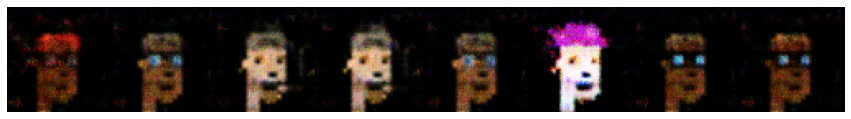

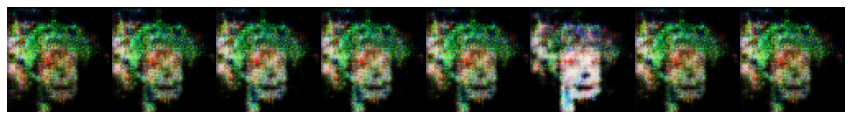

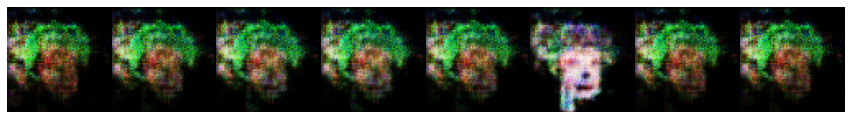

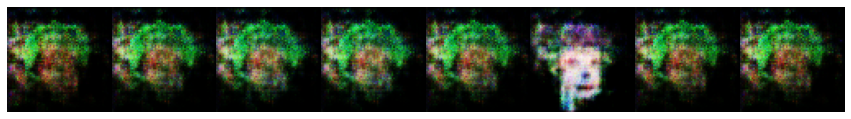

Epoch [   41/  100] | d_loss: 0.4523 | g_loss: 3.8815
Epoch [   42/  100] | d_loss: 0.3895 | g_loss: 3.2981
Epoch [   43/  100] | d_loss: 0.3609 | g_loss: 7.0136
Epoch [   44/  100] | d_loss: 0.3486 | g_loss: 5.7708
Epoch [   45/  100] | d_loss: 0.3593 | g_loss: 5.1000
Epoch [   46/  100] | d_loss: 0.3827 | g_loss: 3.7422
Epoch [   47/  100] | d_loss: 1.1789 | g_loss: 1.1781
Epoch [   48/  100] | d_loss: 0.5236 | g_loss: 2.0326
Epoch [   49/  100] | d_loss: 0.5329 | g_loss: 2.7968
Epoch [   50/  100] | d_loss: 1.5320 | g_loss: 0.4171


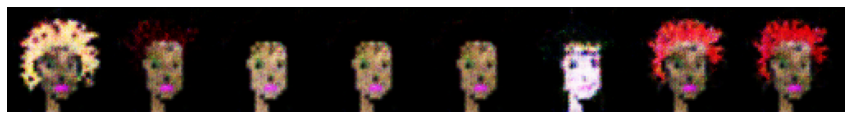

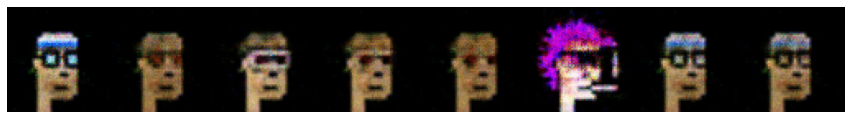

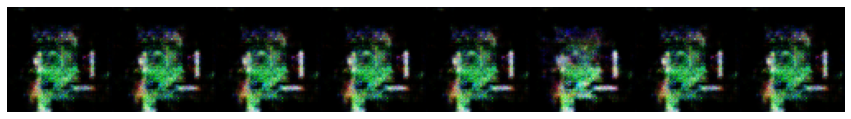

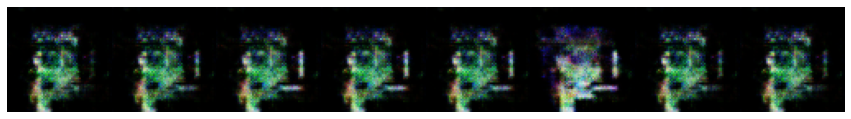

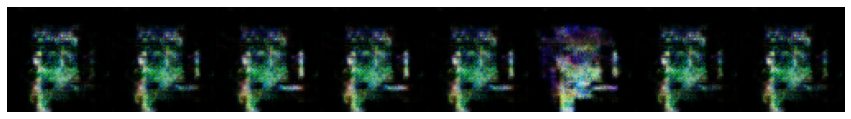

Epoch [   51/  100] | d_loss: 0.7515 | g_loss: 1.1883
Epoch [   52/  100] | d_loss: 0.3836 | g_loss: 4.7123
Epoch [   53/  100] | d_loss: 0.4403 | g_loss: 3.5676
Epoch [   54/  100] | d_loss: 0.6547 | g_loss: 2.4021
Epoch [   55/  100] | d_loss: 0.7299 | g_loss: 2.3510
Epoch [   56/  100] | d_loss: 0.8148 | g_loss: 1.2212
Epoch [   57/  100] | d_loss: 2.1241 | g_loss: 0.5705
Epoch [   58/  100] | d_loss: 1.1364 | g_loss: 1.3758
Epoch [   59/  100] | d_loss: 0.4676 | g_loss: 4.8774
Epoch [   60/  100] | d_loss: 0.7419 | g_loss: 3.0825


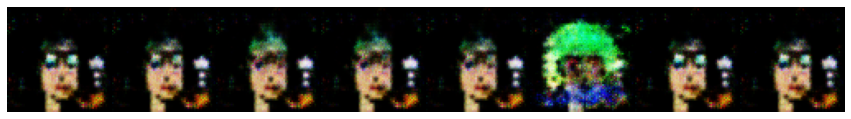

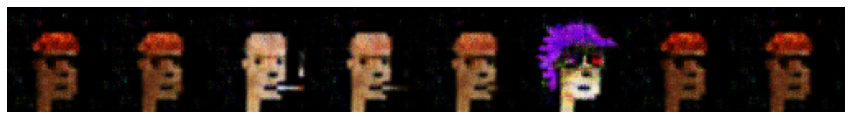

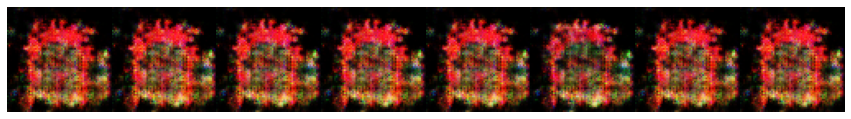

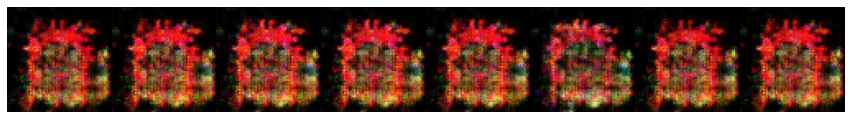

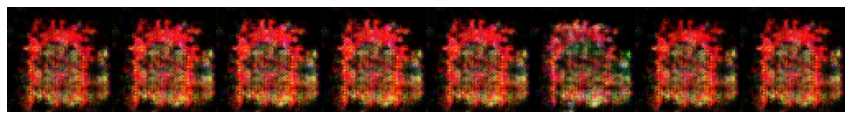

Epoch [   61/  100] | d_loss: 0.9055 | g_loss: 1.1686
Epoch [   62/  100] | d_loss: 0.4740 | g_loss: 2.2245
Epoch [   63/  100] | d_loss: 0.4120 | g_loss: 3.2008
Epoch [   64/  100] | d_loss: 1.5725 | g_loss: 0.3445
Epoch [   65/  100] | d_loss: 0.6400 | g_loss: 1.0968
Epoch [   66/  100] | d_loss: 0.8461 | g_loss: 1.3196
Epoch [   67/  100] | d_loss: 1.2615 | g_loss: 0.6668
Epoch [   68/  100] | d_loss: 1.7450 | g_loss: 0.3868
Epoch [   69/  100] | d_loss: 0.7076 | g_loss: 1.3775
Epoch [   70/  100] | d_loss: 1.2919 | g_loss: 0.8040


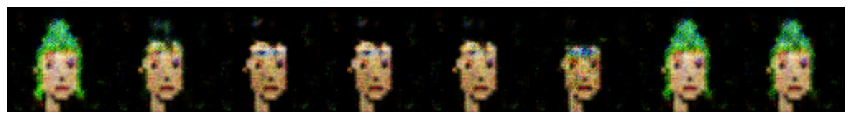

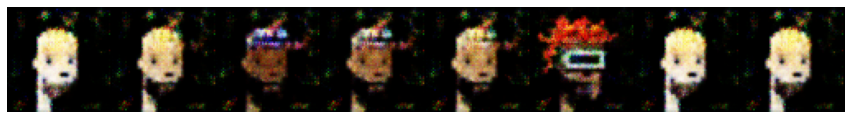

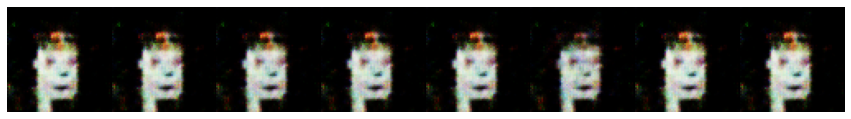

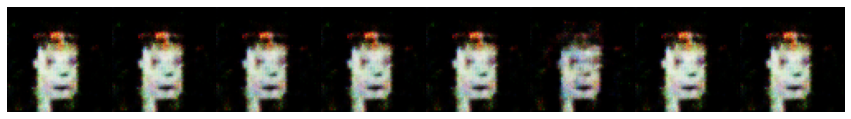

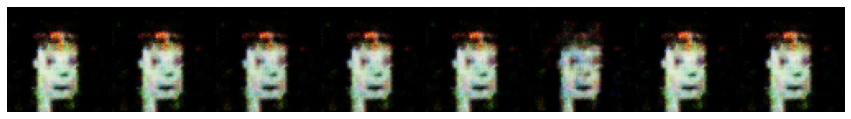

Epoch [   71/  100] | d_loss: 1.7933 | g_loss: 0.4236
Epoch [   72/  100] | d_loss: 2.1440 | g_loss: 0.5134
Epoch [   73/  100] | d_loss: 0.3425 | g_loss: 3.6191
Epoch [   74/  100] | d_loss: 0.5628 | g_loss: 0.8899
Epoch [   75/  100] | d_loss: 0.3777 | g_loss: 4.1364
Epoch [   76/  100] | d_loss: 0.6330 | g_loss: 1.2277
Epoch [   77/  100] | d_loss: 0.4232 | g_loss: 3.1811
Epoch [   78/  100] | d_loss: 1.7689 | g_loss: 1.0532
Epoch [   79/  100] | d_loss: 0.5277 | g_loss: 1.9446
Epoch [   80/  100] | d_loss: 1.4644 | g_loss: 0.7919


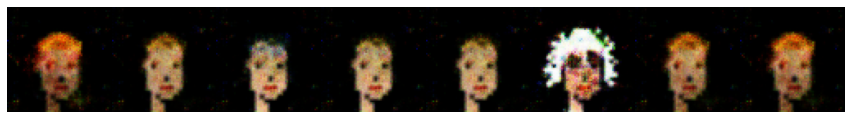

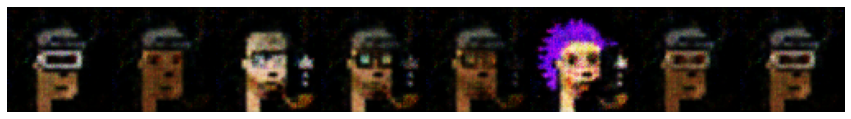

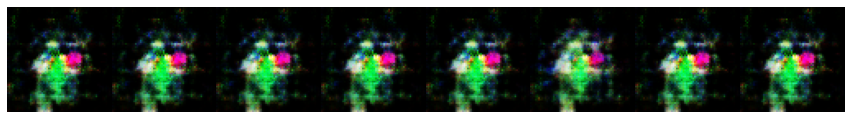

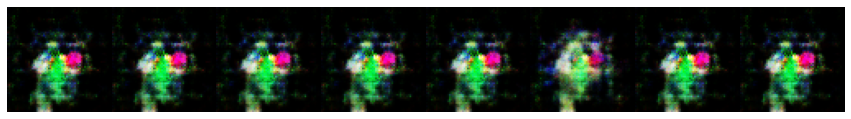

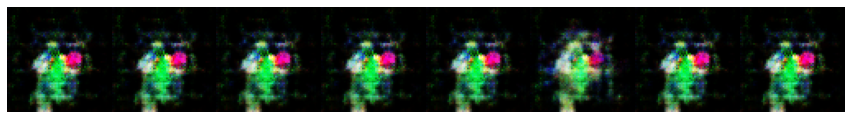

Epoch [   81/  100] | d_loss: 0.8102 | g_loss: 2.2649
Epoch [   82/  100] | d_loss: 2.0512 | g_loss: 0.4100
Epoch [   83/  100] | d_loss: 0.5756 | g_loss: 3.5594
Epoch [   84/  100] | d_loss: 1.2432 | g_loss: 1.0034
Epoch [   85/  100] | d_loss: 1.3932 | g_loss: 0.5886
Epoch [   86/  100] | d_loss: 0.5875 | g_loss: 1.5092
Epoch [   87/  100] | d_loss: 0.5307 | g_loss: 2.9631
Epoch [   88/  100] | d_loss: 0.4238 | g_loss: 5.7056
Epoch [   89/  100] | d_loss: 1.4570 | g_loss: 1.0520
Epoch [   90/  100] | d_loss: 0.3578 | g_loss: 4.3318


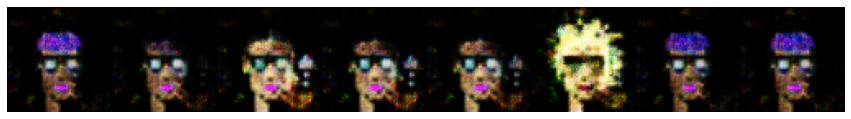

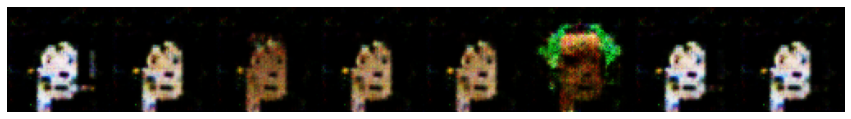

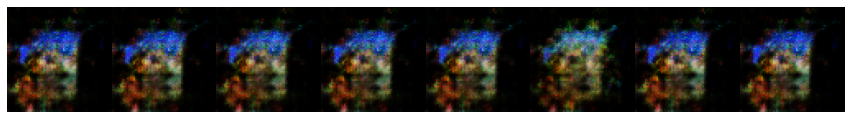

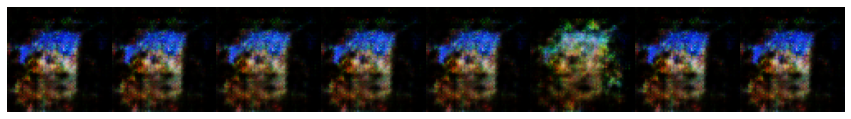

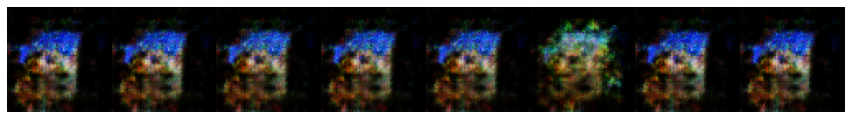

Epoch [   91/  100] | d_loss: 0.4166 | g_loss: 4.4434
Epoch [   92/  100] | d_loss: 2.3130 | g_loss: 0.4389
Epoch [   93/  100] | d_loss: 0.3762 | g_loss: 7.3699
Epoch [   94/  100] | d_loss: 0.4908 | g_loss: 3.6903
Epoch [   95/  100] | d_loss: 0.3579 | g_loss: 3.7849
Epoch [   96/  100] | d_loss: 1.4683 | g_loss: 0.5211
Epoch [   97/  100] | d_loss: 0.4799 | g_loss: 2.6825
Epoch [   98/  100] | d_loss: 1.0792 | g_loss: 1.6537
Epoch [   99/  100] | d_loss: 0.7417 | g_loss: 2.3144
Epoch [  100/  100] | d_loss: 0.3969 | g_loss: 4.5654


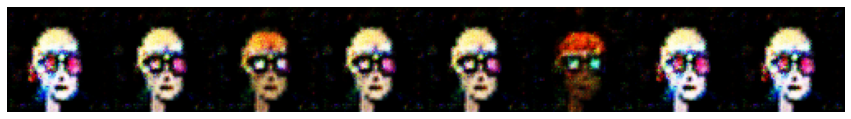

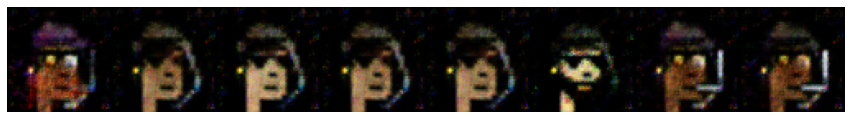

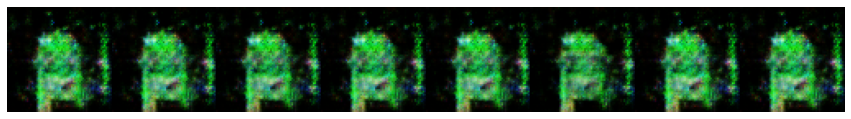

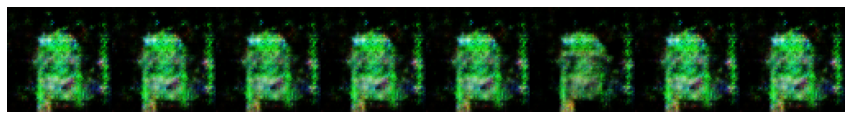

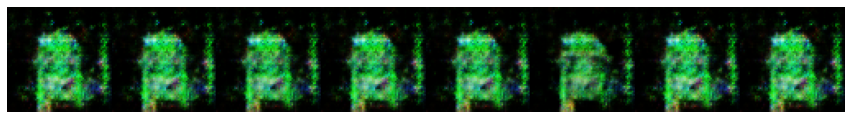

In [ ]:
#start training
%time
n_epochs = 100
train(discriminator,
      generator,
      n_epochs,
      data_loader,
      d_optimizer,
      g_optimizer,
      z_dim,
      print_every=10,
      device=device)

In [ ]:
def save_model(generator,file_name):
    generator = generator.to('cuda')
    torch.save(generator.state_dict(),"cryptopunks_generator.pth")

save_model(generator,"kaggle")

'Female': 0, <br>
'Male': 1, <br>
'Zombie': 2, <br>
'Ape': 3, <br>
'Alien': 4, <br>

The current label is:  0


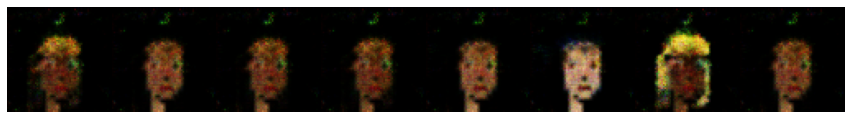

The current label is:  1


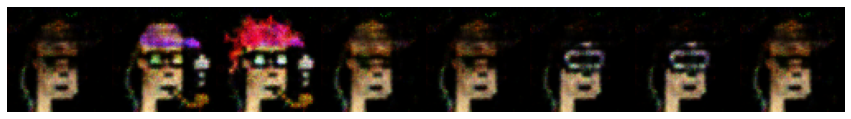

The current label is:  2


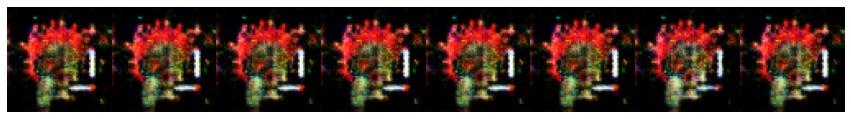

The current label is:  3


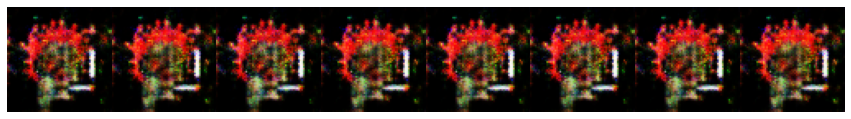

The current label is:  4


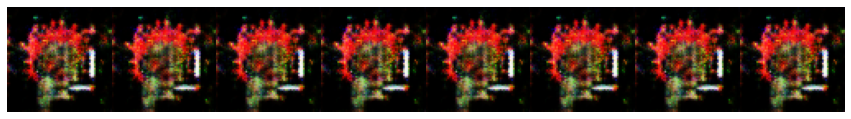

In [ ]:
#sample generation
%matplotlib inline

generator.to(device)
generator.eval()       #eval mode
sample_size=8

test_labels = [0,1,2,3,4]
for test_label in test_labels:
    #generate latent vectors
    fixed_z = Generator.get_noise(n_samples=sample_size, 
                                  z_dim=z_dim, 
                                  device=device)    

    test_label_tensor = torch.tensor(np.ones(sample_size) * test_label).to(device).long()
    sample_image = generator(fixed_z, test_label_tensor)
    print('The current label is: ', test_label)
    print_tensor_images(sample_image)